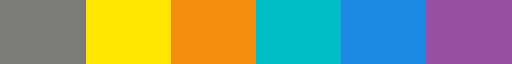

In [5]:
import numpy as np
import pandas as pd
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis
import plotly.graph_objects as go
from scipy.interpolate import interp1d

# Import custom functions
from scripts.functions import *

sns.set(style='white', context='notebook')

import matplotlib as mpl
cmap = mpl.colors.ListedColormap(["#7B7B7A", "#FFE701", "#F38F0D", "#00bfc4", "#1E88E5", "#984ea3"])
state_color_map = {
    0: "#7B7B7A",
    1: "#FFE701",
    2: "#F38F0D",
    3: "#00bfc4",
    4: "#1E88E5",
    5: "#984ea3",
}
cmap

# Load Data and get combined embedding for PFC and HPC

In [15]:
Rat1_HPC = pd.read_hdf('./cycles_data/HPC_resampled_cycles_data.h5', 'Rat_1_OR_N')
Rat4_HPC = pd.read_hdf('./cycles_data/HPC_resampled_cycles_data.h5', 'Rat_4_OR_N')
Rat13_HPC = pd.read_hdf('./cycles_data/HPC_resampled_cycles_data.h5', 'Rat_13_OR_N')

In [17]:
Rat1_PFC = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', 'Rat_1_OR_N')
Rat4_PFC = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', 'Rat_4_OR_N')
Rat13_PFC = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', 'Rat_13_OR_N')

In [19]:
Rat1_HPC['rat'] = 1
Rat4_HPC['rat'] = 4
Rat13_HPC['rat'] = 13
Rat1_PFC['rat'] = 1
Rat4_PFC['rat'] = 4
Rat13_PFC['rat'] = 13
Rat1_HPC['region'] = 'HPC'
Rat4_HPC['region'] = 'HPC'
Rat13_HPC['region'] = 'HPC'
Rat1_PFC['region'] = 'PFC'
Rat4_PFC['region'] = 'PFC'
Rat13_PFC['region'] = 'PFC'

In [21]:
all_data = pd.concat([Rat1_HPC, Rat4_HPC, Rat13_HPC, Rat1_PFC, Rat4_PFC, Rat13_PFC])
del Rat1_HPC, Rat4_HPC, Rat13_HPC, Rat1_PFC, Rat4_PFC, Rat13_PFC

In [23]:
cols = list(all_data.columns)[:-2]
cols.insert(20, 'rat')
cols.insert(21, 'region')
all_data = all_data[cols]

In [25]:
combined_data = all_data
combined_data = combined_data.drop('index', axis=1)
combined_data = combined_data.drop('is_good', axis=1)
combined_data = combined_data.reset_index(drop=True)

In [29]:
waveforms = np.array(combined_data.iloc[:, -128:])

In [64]:
ID = np.round(np.nanmean(abids(waveforms, 50)))
ID

4.0

In [31]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(waveforms)
emb = embedding.embedding_

C:\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [32]:
df_emb = pd.DataFrame(emb, columns=['emb1','emb2','emb3'])
combined_data = pd.concat([combined_data, df_emb], axis=1)

In [33]:
combined_data['Post_Trial'] = combined_data.Post_Trial.astype('category')
combined_data['rat'] = combined_data.rat.astype('category')
combined_data['region'] = combined_data.region.astype('category')

In [34]:
# combined_data.drop(combined_data[combined_data['start_sample']/(2500*60) > 180].index, inplace=True)

In [35]:
combined_data

,start_sample,stop_sample,duration,duration_samples,peak2trough,asc2desc,max_amp,trough_values,peak_values,mean_if,...,121,122,123,124,125,126,127,emb1,emb2,emb3
0,2044,2878,835,835,0.451576,0.520545,0.970813,-0.714689,0.601384,2.992147,...,-0.133299,-0.109425,-0.086248,-0.063853,-0.042327,-0.021755,-0.002210,13.763946,1.085728,5.661011
1,2879,3580,702,702,0.238579,0.492314,1.067478,-0.905404,0.129400,3.562866,...,-0.140162,-0.115621,-0.091555,-0.068018,-0.045049,-0.022703,-0.001012,12.811741,-1.794072,10.389785
2,5534,6654,1121,1121,0.574703,0.500522,0.615068,-0.553717,0.559725,2.231119,...,-0.186845,-0.156087,-0.125034,-0.093833,-0.062626,-0.031558,-0.000770,11.282234,3.042912,2.149687
3,9667,10462,796,796,0.431228,0.500151,1.900646,-1.488631,0.642636,3.139712,...,-0.425409,-0.357707,-0.289198,-0.220037,-0.150385,-0.080404,-0.010252,13.273206,3.085133,11.094723
4,10463,11292,830,830,0.539951,0.512883,1.900596,-0.692908,1.473728,3.012959,...,-0.169775,-0.141347,-0.113060,-0.084981,-0.057168,-0.029680,-0.002566,11.200309,7.586056,6.952369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215994,26992989,26994002,1014,1014,0.498489,0.566368,3.667044,-3.398502,2.842350,2.464485,...,-0.674539,-0.553977,-0.436913,-0.323762,-0.214912,-0.110720,-0.011518,7.971789,5.855112,12.472081
215995,26995839,26996484,646,646,0.514095,0.498015,0.627377,-0.446820,0.562484,3.874386,...,-0.128741,-0.107807,-0.086691,-0.065451,-0.044147,-0.022837,-0.001581,12.219954,1.505724,2.021127
215996,26996485,26997195,711,711,0.365750,0.497870,1.031072,-1.030022,0.355279,3.515986,...,-0.232280,-0.193493,-0.154731,-0.116078,-0.077619,-0.039439,-0.001618,14.148129,-0.112858,9.821357
215997,26997196,26998004,809,809,0.417333,0.531764,0.858053,-0.717544,0.637364,3.090020,...,-0.107068,-0.087500,-0.068595,-0.050397,-0.032955,-0.016305,-0.000481,13.121631,0.555498,6.620701


In [36]:
def get_section(start_sample, fs=2500):
    if start_sample/(fs*60) <= 45:
        return 1
    elif start_sample/(fs*60) <= 90:
        return 2
    elif start_sample/(fs*60) <= 135:
        return 3
    return 4

In [37]:
combined_data['section'] = combined_data['start_sample'].apply(get_section)

### UMAP Plots

In [ ]:
# 3D plot of sleep states projected on UMAP
data = combined_data
feature = 'peak2trough'

fig = px.scatter_3d(x=combined_data['emb1'], y=combined_data['emb2'], z=combined_data['emb3'],
              color=data[feature], color_discrete_map=state_color_map)
fig.update_layout(autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                      coloraxis_colorbar_title=feature,
                      coloraxis=dict(
                            cmin=np.percentile(data[feature], 1),
                            cmax=np.percentile(data[feature], 99)
                      ),
                 legend_title_text="State",
)
fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/Resampled-Waveforms/Rat{rat}/Rat_{rat}_ORN_PFC_embedding_state.html")
# fig.write_image("Rat6_ORN_PFC_3D_embedding.png", engine="kaleido")

In [29]:
# 3D plots of features projected on UMAP
from plotly.colors import make_colorscale
features = ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if']

for feature in features:
    fig = px.scatter_3d(x=combined_data['emb1'], y=combined_data['emb2'], z=combined_data['emb3'],
                  color=combined_data[feature])
    fig.update_layout(autosize=False,width=800,height=600,
                      scene=Scene(xaxis=XAxis(title='UMAP-1'),
                                yaxis=YAxis(title='UMAP-2'),
                                zaxis=ZAxis(title='UMAP-3')),
                      coloraxis_colorbar_title=feature,
                      coloraxis=dict(
                            cmin=np.percentile(combined_data[feature], 0),
                            cmax=np.percentile(combined_data[feature], 100)))
    # fig.show()
    # fig.write_html(f"./plots/UMAP-ORN-Whole/Combined_ORN/Projected Features/CombinedORN_PFC_embedding_{feature}.html")

# State-Centroid Trajectory

In [47]:
state = 3
# section_length = 30

In [52]:
combined_data['section'] = combined_data['start_sample'].apply(get_section)

In [54]:
centroids = []

for section in range(1, max(combined_data['section'])+1):
    metrics_section = combined_data[(combined_data['section'] == section) & (combined_data['State'] == state)]
    centroid = np.array(np.mean(metrics_section[['emb1','emb2','emb3']], axis=0))
    centroids.append(centroid)

In [56]:
# ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if']

In [ ]:
from copy import deepcopy
data = deepcopy(combined_data)

feature = 'range_if'
step_size = 14
height_offsets = {section: (section - 1) * step_size for section in range(1, max(combined_data['section']) +1)}
data['z_offset'] = data['emb3'] + np.array(data['section'].map(height_offsets))

fig = px.scatter_3d(
    x=data['emb1'], 
    y=data['emb2'], 
    z=data['z_offset'],
    color=data[feature],
    range_color=[
        np.percentile(combined_data[feature], 1),
        np.percentile(combined_data[feature], 99)
    ],
    labels={'color': feature})
fig.add_scatter3d(
    x=[centroid[0] for centroid in centroids],
    y=[centroid[1] for centroid in centroids],
    z=[centroid[2] + height_offsets[i + 1] for i, centroid in enumerate(centroids)],
    mode='markers',
    marker=dict(size=10, color='red', symbol='circle', opacity=1),
    name=f'State-{state} Centroid',
    showlegend=False)
fig.add_scatter3d(
    x=[centroid[0] for centroid in centroids],
    y=[centroid[1] for centroid in centroids],
    z=[centroid[2] + height_offsets[i + 1] for i, centroid in enumerate(centroids)],
    mode='lines',
    line=dict(color='black', width=2),
    name='Centroid Path',
    showlegend=False)
for section, z_pos in height_offsets.items():
    fig.add_trace(
        go.Scatter3d(
            x=[15], y=[-5], z=[z_pos + 5],
            mode='text',
            text=f"{(section-1)*section_length} - {section*section_length} minutes",
            textfont=dict(size=12, color='black'),
            showlegend=False))
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3'),
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=3)))
fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/Combined_ORN/State-3 centroid across sections/ORN_PFC_{feature}_sections.html")

In [ ]:
# 3D plots of features projected on UMAP
from plotly.colors import make_colorscale
feature = 'State'
# custom_colorscale = [[0.0, 'blue'], [0.5, 'white'], [1.0, 'orange']]
fig = px.scatter_3d(x=combined_data['emb1'], y=combined_data['emb2'], z=combined_data['emb3'],
              color=combined_data[feature])#,color_continuous_scale=custom_colorscale)
fig.update_layout(autosize=False,width=800,height=600,
                  scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                  coloraxis_colorbar_title=feature,
                  coloraxis=dict(
                        cmin=np.percentile(combined_data[feature], 0),
                        cmax=np.percentile(combined_data[feature], 100)))
fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/Combined_ORN/Projected Features/CombinedORN_PFC_embedding_{feature}.html")
# fig.write_image(f"{}_ORN_3D_embedding.png", engine="kaleido")

# Rat-Centroids across 4 sections

In [91]:
rat = 1

In [93]:
metrics_section1 = combined_data[(combined_data['section'] == 1) & (combined_data['rat'] == rat)]
metrics_section2 = combined_data[(combined_data['section'] == 2) & (combined_data['rat'] == rat)]
metrics_section3 = combined_data[(combined_data['section'] == 3) & (combined_data['rat'] == rat)]
metrics_section4 = combined_data[(combined_data['section'] == 4) & (combined_data['rat'] == rat)]

centroid_section1 =  np.array(np.mean(metrics_section1.iloc[:, -3:],axis=0))
centroid_section2 =  np.array(np.mean(metrics_section1.iloc[:, -3:],axis=0))
centroid_section3 =  np.array(np.mean(metrics_section1.iloc[:, -3:],axis=0))
centroid_section4 =  np.array(np.mean(metrics_section1.iloc[:, -3:],axis=0))

In [95]:
from copy import deepcopy
# Split 3D plot with projected sleep states
data = deepcopy(combined_data)

# Assign section based on start_sample and create z_offset using height_offsets
height_offsets = {1: 0, 2: 14, 3: 28, 4: 42}
data['z_offset'] = data['emb3'] + np.array(data['section'].map(height_offsets))

fig = px.scatter_3d(
    x=data['emb1'], 
    y=data['emb2'], 
    z=data['z_offset'],
    color=data['rat'],
    color_discrete_map=state_color_map
)

fig.add_scatter3d(
    x=[centroid_section1[0],centroid_section2[0],centroid_section3[0],centroid_section4[0]],
    y=[centroid_section1[1],centroid_section2[1],centroid_section3[1],centroid_section4[1]],
    z=[centroid_section1[2],centroid_section2[2]+height_offsets[2],centroid_section3[2]+height_offsets[3],centroid_section4[2]+height_offsets[4]],
    mode='markers',
    marker=dict(size=10, color='red', symbol='circle', opacity=1),
    name='Centroid'  # Optional legend label
)

for section, z_pos in height_offsets.items():
    fig.add_trace(
        go.Scatter3d(
            x=[-5], y=[10], z=[z_pos + 5],
            mode='text',
            text=f"{(section-1)*45} - {section*45} minutes",
            textfont=dict(size=12, color='black'),
            showlegend=False
        )
    )

fig.update_layout(
    autosize=False,
    width=800,
    height=800,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3')
    ),
    legend_title_text="State"
)
fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/PostTrial5_ORN_PFC_split_embedding.html")
# fig.write_image("Rat13_ORN_split_embedding.png", engine="kaleido")

# PostTrial_5-Centroids across time sections

In [97]:
post_trial = 5

In [99]:
combined_data['section'] = combined_data['start_sample'].apply(get_section,section_length=30)

In [101]:
centroids = []

for section in range(1, max(combined_data['section'])):
    metrics_section = combined_data[(combined_data['section'] == section) & (combined_data['Post_Trial'] == post_trial)]
    centroid = centroid = np.array(np.mean(metrics_section[['emb1','emb2','emb3']], axis=0))
    centroids.append(centroid)

In [ ]:
data = deepcopy(combined_data)

step_size = 12
height_offsets = {section: (section - 1) * step_size for section in range(1, max(combined_data['section']) + 1)}
data['z_offset'] = data['emb3'] + np.array(data['section'].map(height_offsets))

fig = px.scatter_3d(
    x=data['emb1'], 
    y=data['emb2'], 
    z=data['z_offset'],
    color=data['Post_Trial'],
    color_discrete_map=state_color_map
)
fig.add_scatter3d(
    x=[centroid[0] for centroid in centroids],
    y=[centroid[1] for centroid in centroids],
    z=[centroid[2] + height_offsets[i + 1] for i, centroid in enumerate(centroids)],
    mode='markers',
    marker=dict(size=10, color='red', symbol='circle', opacity=1),
    name='Centroid'
)
fig.add_scatter3d(
    x=[centroid[0] for centroid in centroids],
    y=[centroid[1] for centroid in centroids],
    z=[centroid[2] + height_offsets[i + 1] for i, centroid in enumerate(centroids)],
    mode='lines',
    line=dict(color='black', width=2),
    name='Centroid Path'
)
fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3'),
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=2.5)
    ),
    legend_title_text="State"
)
fig.show()